# Endometrium analysis - clusters visualization

In [3]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import os
import sys

def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)

sc.settings.verbosity = 1  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = './figures_both_organoid/'
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

sys.executable

scanpy==1.4.4 anndata==0.6.22rc1 umap==0.3.10 numpy==1.17.5 scipy==1.3.0 pandas==0.25.3 scikit-learn==0.22.1 statsmodels==0.10.2 python-igraph==0.7.1 louvain==0.6.1


'/home/jovyan/my-conda-envs/myenvSC/bin/python'

## Load data organoid 2

In [4]:
adata_o2 = sc.read('data/organoids-N3-TC-keep-ccg.h5ad')
adata_o2.X.shape

(30300, 24021)

## Fix manually Treatment annotation for WSSS_END8730359

In [5]:
idx = np.array([i in ['WSSS_END8730359'] for i in adata_o2.obs['Sample']])
adata_o2.obs.at[ idx, 'Treatment']  = 'E+P'

## Fix donors assignement

In [6]:
donors_match = pd.read_csv('data/organoid/donors.tsv', sep='\t', header=None)
donors_match = donors_match.rename(columns={0: 'index', 1: 'Donor_demu'})
donors_match = donors_match.set_index('index')
donors_match.head()

,Donor_demu
index,
WSSS_END8729881-AAACCCAAGCGTATAA,B019
WSSS_END8729881-AAACCCACAAACTCTG,B019
WSSS_END8729881-AAACCCACAGACCTGC,B019
WSSS_END8729881-AAACCCAGTAATGCTC,B019
WSSS_END8729881-AAACCCAGTCAGACTT,B019


In [7]:
adata_o2 = adata_o2[ [i in donors_match.index for i in adata_o2.obs.index] ].copy()

In [8]:
adata_o2.obs = pd.concat([adata_o2.obs, donors_match[ [i in adata_o2.obs.index for i in donors_match.index] ]], join='inner', axis=1)
adata_o2.obs.head()

,Days,Inhibition,Sample,Treatment,batch,Donor,n_genes,percent_mito,n_counts,leiden,scrublet_score,scrublet_cluster_score,zscore,bh_pval,bonf_pval,is_doublet,is_doublet_propagate,Donor_demu
index,,,,,,,,,,,,,,,,,,
WSSS_END8729882-CTGAGGCGTTGTACGT,2.0,N/I,WSSS_END8729882,E,3,B019,3242,0.106340,14510.0,5,0.086154,0.082459,-0.322178,0.834157,1.0,False,False,B019
WSSS_END8729882-TACCTGCAGTCATGCT,2.0,N/I,WSSS_END8729882,E,3,B019,4448,0.103711,21126.0,3,0.066489,0.094156,0.000000,0.834157,1.0,False,False,B019
WSSS_END8730455-GAGAGGTAGCGTTAGG,7.0,N/I,WSSS_END8730455,E+P,9,B044,3544,0.132862,14865.0,2,0.050781,0.075324,-0.577691,0.883086,1.0,False,False,B019
WSSS_END8730359-ACGCACGAGATGTTAG,6.0,N/I,WSSS_END8730359,E+P,8,B044,2728,0.105681,10333.0,2,0.061702,0.075028,-0.475104,0.868496,1.0,False,False,B019
WSSS_END8730359-GGGATCCGTGAAAGTT,6.0,N/I,WSSS_END8730359,E+P,8,B019,7795,0.085386,65608.0,4,0.442478,0.071101,-0.587472,0.868496,1.0,False,False,B044


In [9]:
# we trust new annotations
adata_o2.obs['Donor'] = adata_o2.obs['Donor_demu']

... storing 'Donor' as categorical
... storing 'Donor_demu' as categorical


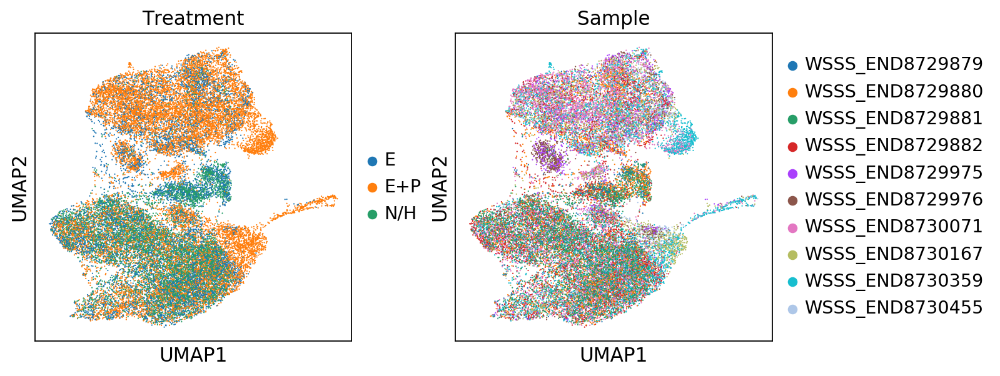

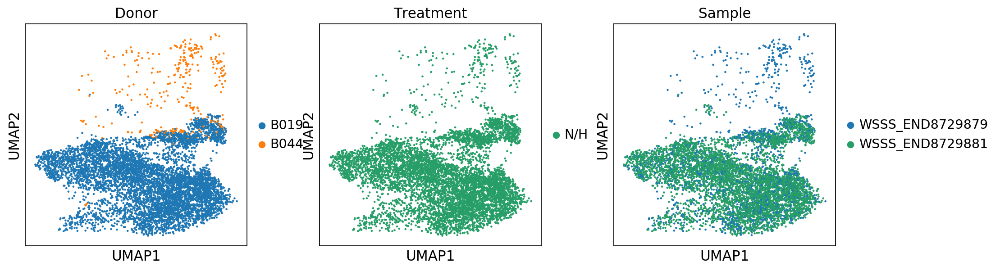

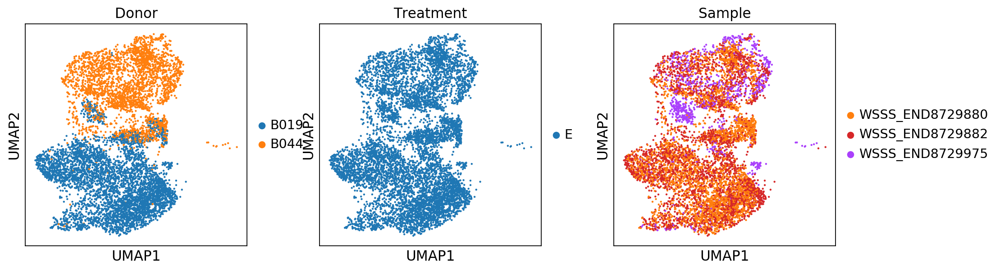

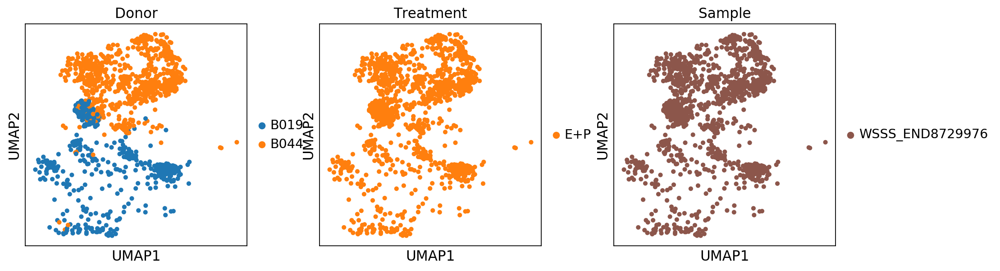

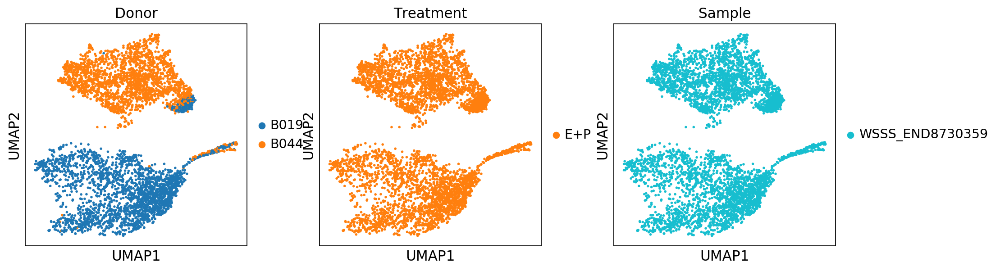

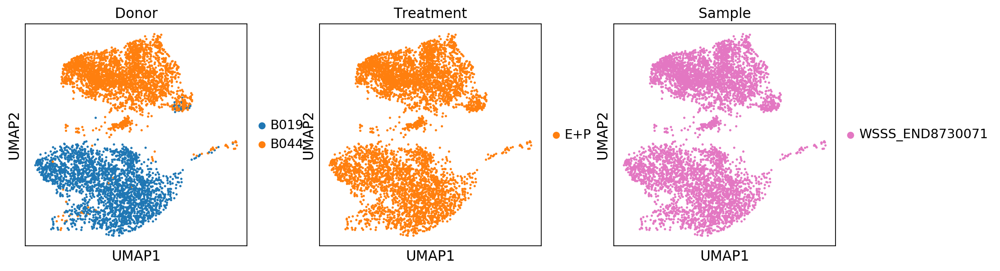

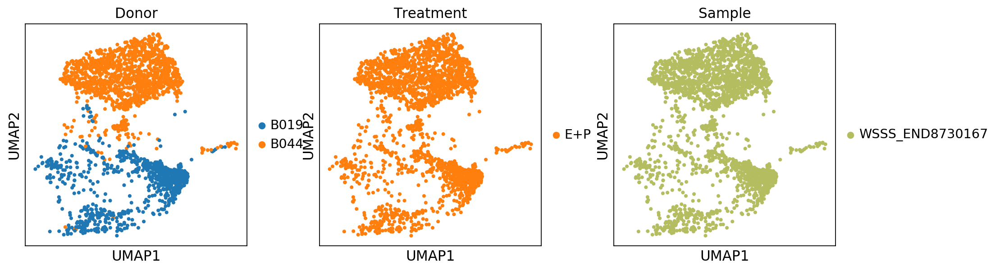

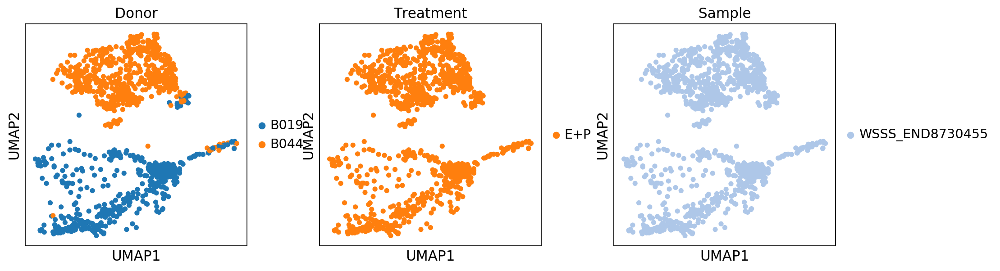

In [10]:
# Check assignement
sc.pl.umap(adata_o2, color=['Treatment', 'Sample'])
sc.pl.umap(adata_o2[[ i in ['N/H'] for i in adata_o2.obs['Treatment']  ]], color=['Donor', 'Treatment', 'Sample'])
sc.pl.umap(adata_o2[[ i in ['E'] for i in adata_o2.obs['Treatment']  ]], color=['Donor', 'Treatment', 'Sample'])
sc.pl.umap(adata_o2[[ i in ['WSSS_END8729976'] for i in adata_o2.obs['Sample']  ]], color=['Donor', 'Treatment', 'Sample'])
sc.pl.umap(adata_o2[[ i in ['WSSS_END8730359'] for i in adata_o2.obs['Sample']  ]], color=['Donor', 'Treatment', 'Sample'])
sc.pl.umap(adata_o2[[ i in ['WSSS_END8730071'] for i in adata_o2.obs['Sample']  ]], color=['Donor', 'Treatment', 'Sample'])
sc.pl.umap(adata_o2[[ i in ['WSSS_END8730167'] for i in adata_o2.obs['Sample']  ]], color=['Donor', 'Treatment', 'Sample'])
sc.pl.umap(adata_o2[[ i in ['WSSS_END8730455'] for i in adata_o2.obs['Sample']  ]], color=['Donor', 'Treatment', 'Sample'])

In [11]:
print(adata_o2.obs[['Inhibition', 'Sample', 'Treatment', 'Days']].drop_duplicates())

                                 Inhibition           Sample Treatment   Days
index                                                                        
WSSS_END8729882-CTGAGGCGTTGTACGT        N/I  WSSS_END8729882         E  2.000
WSSS_END8730455-GAGAGGTAGCGTTAGG        N/I  WSSS_END8730455       E+P  7.000
WSSS_END8730359-ACGCACGAGATGTTAG        N/I  WSSS_END8730359       E+P  6.000
WSSS_END8729880-AACAACCCAAGATGTA        N/I  WSSS_END8729880         E  1.125
WSSS_END8730167-ACTTTCACATTCACAG        N/I  WSSS_END8730167       E+P  5.000
WSSS_END8729881-TTGCGTCCAGCACACC        N/I  WSSS_END8729881       N/H  1.000
WSSS_END8729879-GACGCTGTCTGTTGGA        N/I  WSSS_END8729879       N/H  1.000
WSSS_END8729975-GGAACCCAGTGCTAGG        N/I  WSSS_END8729975         E  3.000
WSSS_END8730071-TATTTCGGTGTGCCTG        N/I  WSSS_END8730071       E+P  4.000
WSSS_END8729976-GACATCATCAGGAAGC        N/I  WSSS_END8729976       E+P  3.125


## Reset object

In [12]:
adata_o2.obs['individual'] = adata_o2.obs['Donor']
adata_o2.obs['leiden_K'] = [ i+"_N18" for i in adata_o2.obs['leiden'] ]
adata_cl2 = anndata.AnnData(X=adata_o2.raw.X, var=adata_o2.raw.var, obs=adata_o2.obs, asview=False)

## Load data organoid 1

In [13]:
adata_o1 = sc.read('data/organoids_pilot_noInhibitors-N3-keep-ccg.h5ad')
adata_o1.X.shape

(23420, 23904)

### Amend column names and content

In [14]:
adata_o1.obs = adata_o1.obs.rename(columns={'treatment': 'Treatment', 'sample': 'Sample'})
adata_o1.obs['Donor'] = 'pilot_A/D'

In [15]:
# Days
adata_o1.obs['Days'] = 1
adata_o1.obs.at[ adata_o1.obs.tp == '3', 'Days']  = 7
adata_o1.obs.at[ adata_o1.obs.tp == '2', 'Days']  = 3
set(adata_o1.obs['Days'])

{1, 3, 7}

In [16]:
# Treatment
categories = np.array( ['E', 'E+P', 'N/H', 'control', 'treated'])
adata_o1.obs.Treatment = pd.Categorical(adata_o1.obs.Treatment, categories=categories, ordered=True)
adata_o1.obs.at[ adata_o1.obs.Treatment == 'control', 'Treatment']  = 'N/H'
adata_o1.obs.at[ adata_o1.obs.Days == 3, 'Treatment']  = 'E'
adata_o1.obs.at[ adata_o1.obs.Days == 7, 'Treatment']  = 'E+P'
set(adata_o1.obs.Treatment)

{'E', 'E+P', 'N/H'}

In [17]:
print(adata_o1.obs[[ 'Sample', 'Treatment', 'Days']].drop_duplicates())

                                             Sample Treatment  Days
index                                                              
organoids7090723-AAACCTGCAGGCTCAC  organoids7090723       N/H     1
organoids7090724-AAACCTGAGACACGAC  organoids7090724       N/H     1
organoids7090726-AAACCTGAGATGAGAG  organoids7090726         E     3
organoids7090728-AAACCTGCACCAGATT  organoids7090728         E     3
organoids7090730-AAACCTGAGCTAAACA  organoids7090730       E+P     7
organoids7090732-AAACCTGAGGCAAAGA  organoids7090732       E+P     7


## Reset object

In [18]:
adata_o1.obs['leiden_K'] = [ i+"_N19" for i in adata_o1.obs['leiden'] ]
adata_cl1 = anndata.AnnData(X=adata_o1.raw.X, var=adata_o1.raw.var, obs=adata_o1.obs, asview=False)

# Merge both objects

In [19]:
adata = adata_cl1.concatenate(adata_cl2, join='inner', index_unique=None)

In [20]:
set(adata.obs.individual)

{'A', 'B019', 'B044', 'D'}

... storing 'Donor' as categorical
... storing 'Donor_demu' as categorical
... storing 'Inhibition' as categorical
... storing 'Sample' as categorical
... storing 'Treatment' as categorical
... storing 'individual' as categorical
... storing 'leiden' as categorical
... storing 'leiden_K' as categorical
... storing 'tp' as categorical


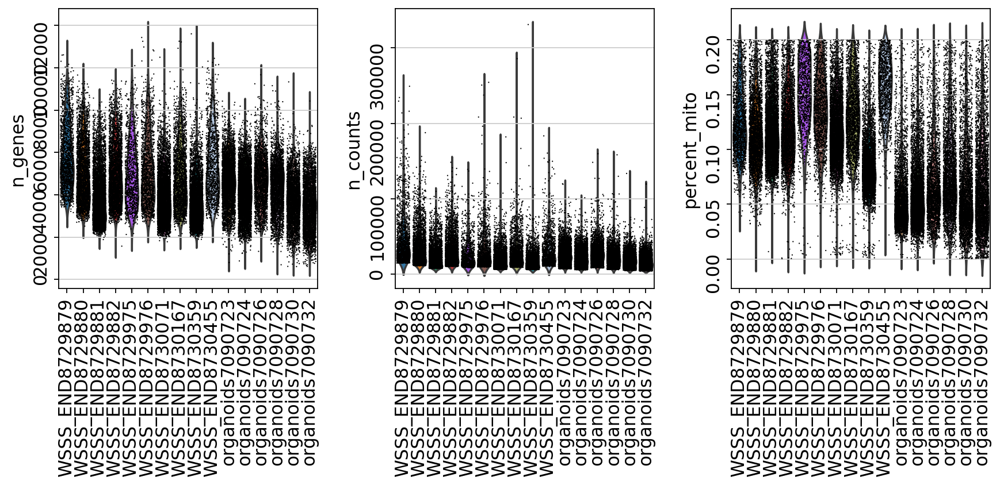

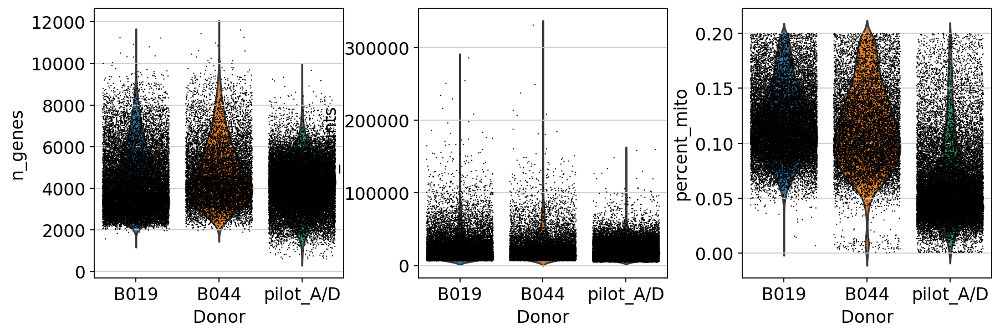

In [21]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'], groupby='Sample', rotation=90,  jitter=0.4, save='_perSample.pdf')
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'], groupby='Donor', jitter=0.4, save='_perDonor.pdf')

## Preprocess the data again

#### Filter non-expressed genes

In [22]:
sc.pp.filter_genes(adata, min_cells=5)
adata.raw = sc.pp.log1p(adata, copy=True)

#### Identify cells behaving like cc genes
Per genes analysis: identify genes behaving like known cell cycle genes

In [23]:
bdata = adata.copy()
# Normalize total counts per cell
sc.pp.normalize_per_cell(bdata, counts_per_cell_after=1e4)
# Logarithmize the data matrix
sc.pp.log1p(bdata)
# Extract highly variable genes
sc.pp.highly_variable_genes(bdata)
highly_variable_genes = bdata.var["highly_variable"]
bdata = bdata[:, highly_variable_genes]
# Traspose matrix for a GENE-centered analysis
bdata = bdata.copy().T

In [24]:
# Scale data to unit variance and zero mean
sc.pp.scale(bdata, max_value=10)
# Scatter plot in PCA coordinates
sc.tl.pca(bdata)

In [25]:
num_pcs = 20
# Compute a neighborhood graph of observations
sc.pp.neighbors(bdata,n_pcs=num_pcs)
# Embed the neighborhood graph using UMAP
sc.tl.umap(bdata)
# Cluster GENES into subgroups using louvain: resolution < 1 to find less clusters
sc.tl.leiden(bdata, resolution=0.5)

In [26]:
# Locate ccs cluster
bdata.obs['known_cyclers'] = [i in ['CDK1','MKI67','CCNB2','PCNA'] for i in bdata.obs_names]
sc.pl.umap(bdata, color=['known_cyclers', 'leiden'], color_map='OrRd',save='_ccg_identification.pdf', show=False)
print(bdata.obs.loc[[i in ['CDK1','MKI67','CCNB2','PCNA'] for i in bdata.obs_names],'leiden'])

CDK1     6
MKI67    6
CCNB2    6
PCNA     6
Name: leiden, dtype: category
Categories (7, object): [0, 1, 2, 3, 4, 5, 6]


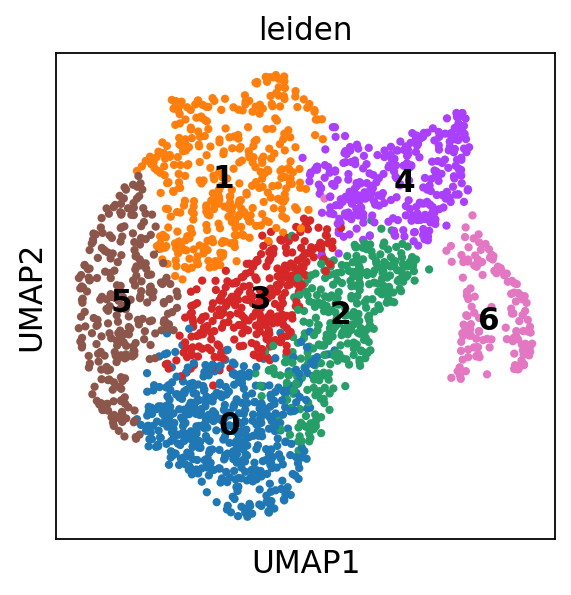

In [27]:
sc.pl.umap(bdata, color='leiden', save=None, legend_loc='on data', show=False)

In [28]:
ccgs_cl = bdata.obs.loc['CDK1',['leiden']][0]
print("Cell cycle genes cluster is "+ccgs_cl)

Cell cycle genes cluster is 6


#### Remove ccgs

In [29]:
# Add unstructured dict-like annotation for ccgs
adata.uns['ccgs'] = list(bdata.obs[bdata.obs['leiden']==ccgs_cl].index)

In [30]:
# Remove cc genes
print('Total number of genes before ccg filter: {:d}'.format(adata.n_vars))
adata = adata[:,[i not in adata.uns['ccgs'] for i in adata.var_names]]
print('Total number of genes after ccg filter: {:d}'.format(adata.n_vars))

Total number of genes before ccg filter: 24241
Total number of genes after ccg filter: 24105


#### Normalize per cell

In [31]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

Trying to set attribute `.obs` of view, making a copy.


In [32]:
sc.pp.log1p(adata)

#### HVGs
These are going to be definetively different from the global annlysis. It is key to redefine these.

In [33]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, min_disp=0.25)

In [34]:
len(set(adata.var_names[  adata.var["highly_variable"] ]))

2803

In [35]:
# Filter HVGs
highly_variable_genes = adata.var["highly_variable"]
adata = adata[:, highly_variable_genes]

In [36]:
adata.X.shape

(53720, 2803)

#### Scale and regress out cell cycle genes

In [ ]:
# Scale
sc.pp.scale(adata, max_value=10)

/home/jovyan/my-conda-envs/myenvSC/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:869: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [ ]:
# Regress out cell cycle genes
cell_cycle_genes = [x.strip() for x in open(file='/home/jovyan/farm/gsea/raw/seurat_cellcycle/regev_lab_cell_cycle_genes.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
s_genes = [x for x in s_genes if x in adata.var_names]
g2m_genes = [x for x in g2m_genes if x in adata.var_names]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)
# sc.pp.regress_out(adata, ['S_score', 'G2M_score'])

## PCA

In [ ]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata, log=True, save='.pdf')

In [ ]:
# visualize before integration
sc.pp.neighbors(adata, n_pcs = 20, random_state=1)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['Days', 'Treatment', 'phase',  'Donor', 'individual', 'batch',  'Sample'], save='_precorrection.pdf', ncols = 2)
markers = ["PAEP", "DPP4", "WNT7A", "FOXJ1", "KRT13", 
                         "SOX2", "LGR6", "MMP7", "LHX1", "KRT5",
                         "TP73", "SERPINA1", "SCGB2A1", "SCGB2A2" ,"HEY1", "PLAU", "PLAUR"]
markers = sorted(markers)
sc.pl.umap(adata, color=markers,  save='-markers_precorrection.pdf',color_map='OrRd', use_raw=True)

## Batch correction using HARMONY

In [37]:
# Extract PCA matrix and batch array
n_pcs = 20 #10
pca = adata.obsm['X_pca'][:, 0:(n_pcs)]
batch = adata.obs['Donor']

In [38]:
# Batch-correct the PCA using HARMONY method
%load_ext rpy2.ipython

In [39]:
%%R -i pca -i batch -o hem

library(harmony)
library(magrittr)
set.seed(1)
hem <- HarmonyMatrix(pca, batch, theta=2, do_pca=FALSE, verbose = FALSE)
hem = data.frame(hem)

R[write to console]: Loading required package: Rcpp



In [40]:
# Add harmony values to the anndata object
adata.obsm['X_pca'] = hem.values

In [41]:
sc.pp.neighbors(adata, n_pcs = n_pcs, random_state=1)

/home/jovyan/my-conda-envs/myenvSC/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../my-conda-envs/myenvSC/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/home/jovyan/my-conda-envs/myenvSC/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../my-conda-envs/myen

In [42]:
# Visualize
sc.tl.umap(adata)

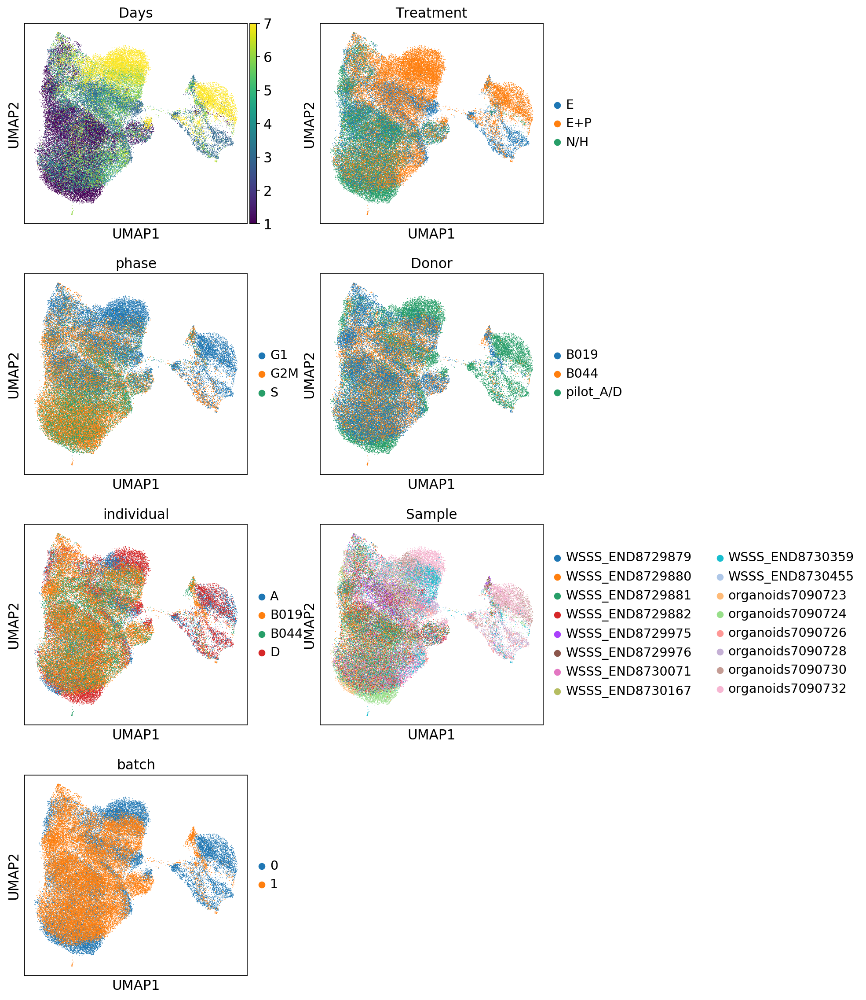

In [43]:
sc.pl.umap(adata, color=['Days', 'Treatment', 'phase',  'Donor', 'individual', 'Sample', 'batch'], save='.pdf', ncols = 2)

## Identify sub-clusters

In [44]:
sc.tl.leiden(adata, resolution=0.4)

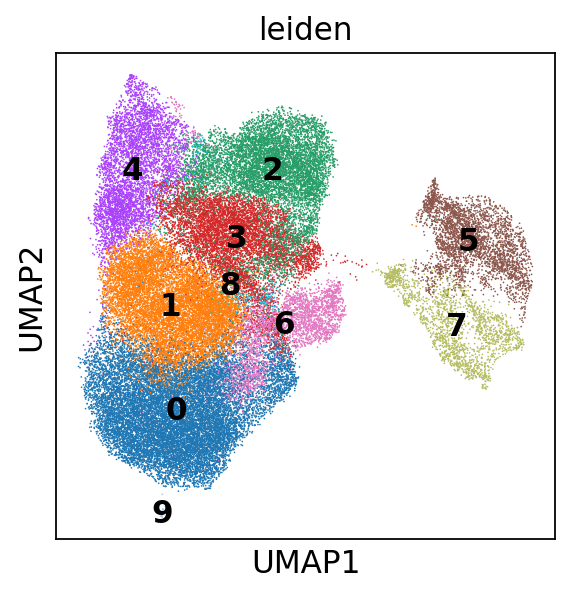

In [45]:
sc.pl.umap(adata, color=['leiden'],legend_loc='on data',save='_clustering_clusnumbers.pdf')

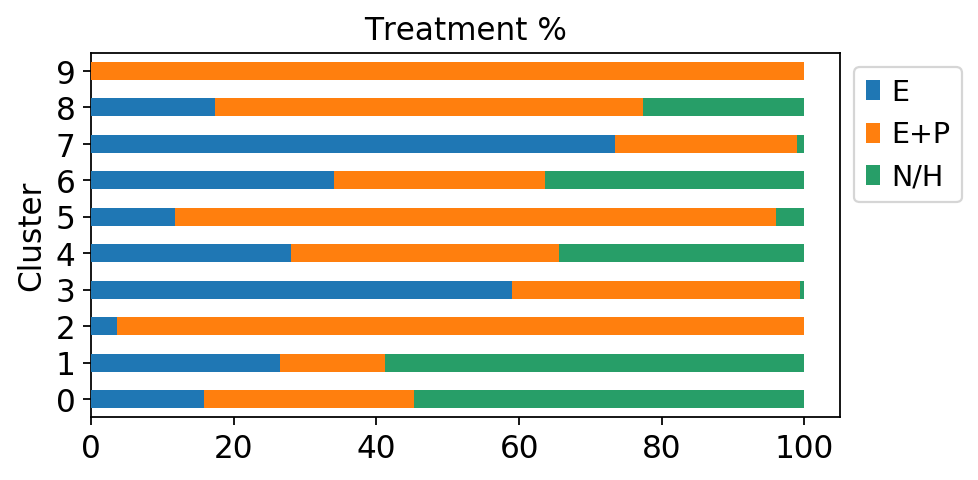

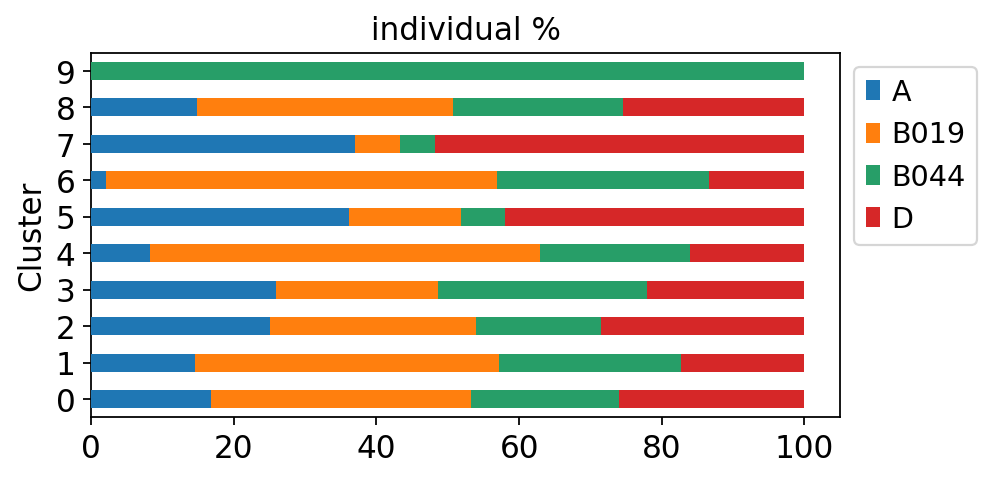

In [46]:
def Barplot(which_var, adata, var='leiden', height=3, color = False):
    plotdata = pd.crosstab(adata.obs[var], adata.obs[which_var], normalize='index') * 100
    if 'category' in plotdata.index.dtype.name:
        plotdata.index.reorder_categories(adata.obs[var].cat.categories[::-1])

    if not color:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False)
    else:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False, color = color)
    ax1.set_title(which_var+' %')
    ax1.set_ylabel(var)
    horiz_offset = 1
    vert_offset = 1.
    ax1 = ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset))
    ax1.figure.savefig(str(sc.settings.figdir)+'/barplot_'+var+'_proportions_'+which_var+'.pdf', bbox_inches='tight',
                       dpi=300, orientation='landscape', format= 'pdf', optimize=True)
    
Barplot('Treatment', adata)
Barplot('individual', adata)

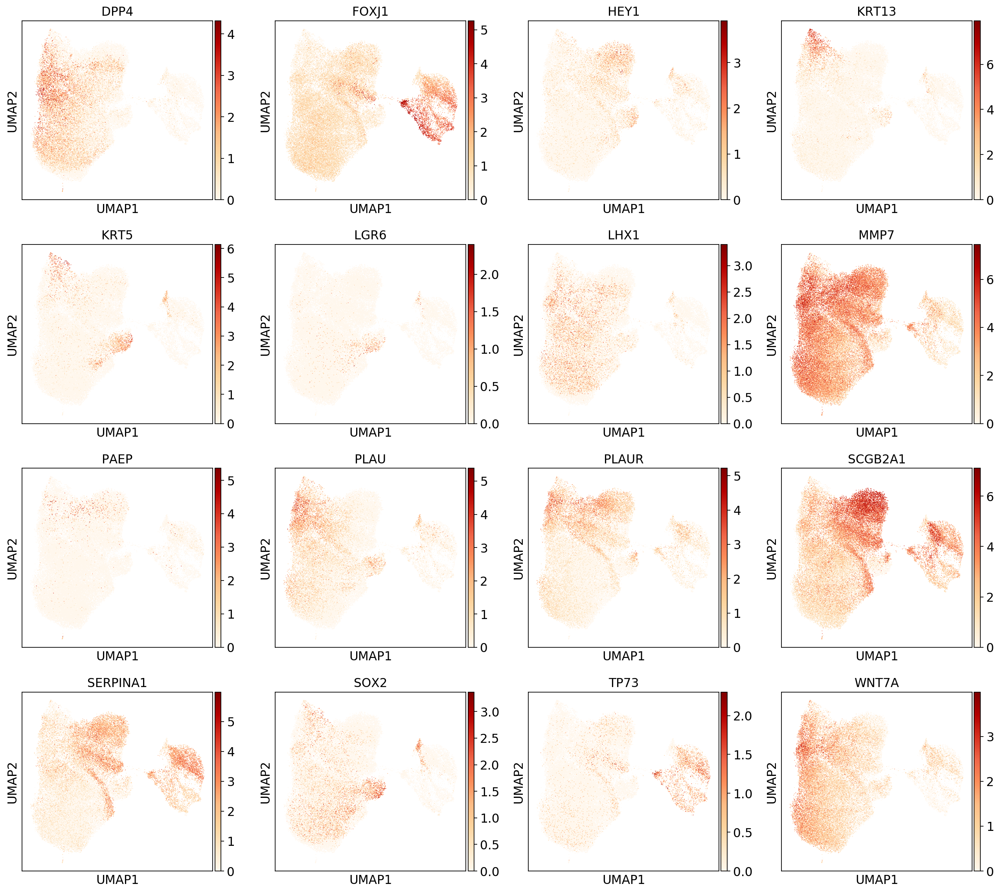

In [47]:
markers = ["PAEP", "DPP4", "WNT7A", "FOXJ1", "KRT13", 
                         "SOX2", "LGR6", "MMP7", "LHX1", "KRT5",
                         "TP73", "SERPINA1", "SCGB2A1", "HEY1", "PLAU", "PLAUR"]
markers = sorted(markers)
sc.pl.umap(adata, color=markers, 
           save='-markers.pdf',color_map='OrRd', use_raw=True) # FEMALE

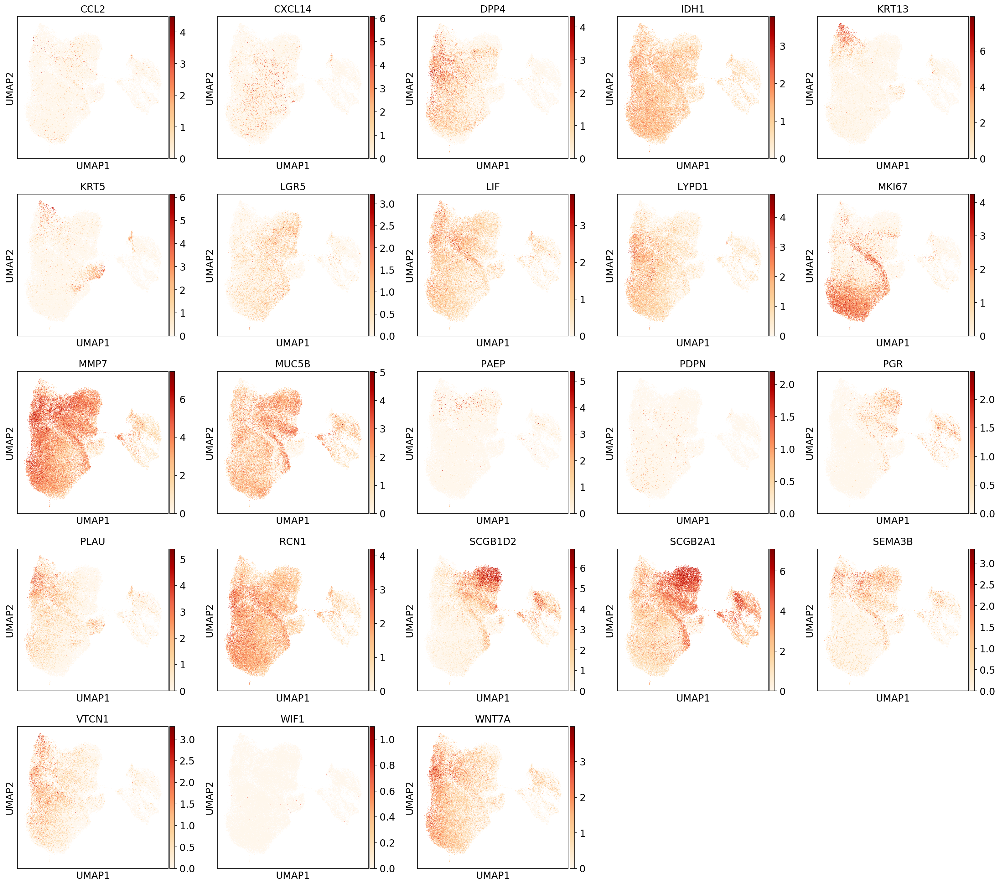

In [48]:
markers = ["WNT7A",  "KRT5", # progenitor 
                         "LGR5", "PDPN", "KRT13", "WIF1", "CCL2", "LYPD1",
                         "MMP7", 
                         "PAEP",  "DPP4", # Early Glandular
                         "SCGB1D2",# Late Glandular
                         "CXCL14", # Only secretory
                         "SEMA3B",  "MUC5B", "MKI67", "PLAU", 'PGR', "SCGB2A1", "VTCN1", "LIF", 'IDH1', 'RCN1']
markers = sorted(markers)
sc.pl.umap(adata, color=markers, save='-markers_pseudotime.pdf',color_map='OrRd', ncols=5, use_raw=True) # FEMALE

## Save

In [ ]:
# os.system('rm data/organoids-all-TC-keep-ccg_forSeurat.h5ad')
# adata_count = anndata.AnnData(X=np.expm1(adata.raw.X), var=adata.raw.var, obs=adata.obs, asview=False)
# adata_count.write('data/organoids-all-TC-keep-ccg_forSeurat.h5ad')

# os.system('rm data/organoids-all-TC-keep-ccg_Luzprocessing.h5ad')
adata.write('data/organoids-all-TC-keep-ccg_Luzprocessing.h5ad')